# Read and analyze case 6126 E08 (Ajia) - 3   [ Otsu's method, SLIC ]

**BMED320: Methods in biomedical research (IMC-ML)  / 2020-11-23**<br>


Using data from Damond et al. A Map of Human Type 1 Diabetes Progression by Imaging Mass Cytometry. Celll Metabolism 2019;29(3):755-768.e5<br>
See: https://github.com/arvidl/BMED320-imaging-mass-cytometry-ml/blob/master/notebooks/imc-case-damond-2019/README.md


## Progression by Imaging Mass Cytometry

Published: 09-04-2020  **Version 2**  **DOI**:10.17632/cydmwsfztj.2  [[link](https://data.mendeley.com/datasets/cydmwsfztj/2)]<br>
Contributor: Nicolas Damond

### Description
Data related to the publication: "A Map of Human Type 1 Diabetes Progression by Imaging Mass Cytometry".

Damond N, Engler S, Zanotelli VRT, Schapiro D, Wasserfall CH, Kusmartseva I, Nick HS, Thorel F, Herrera PL, Atkinson MA and Bodenmiller B. Cell Metab. 2019 Mar 5;29(3):755-768.e5. https://doi.org/10.1016/j.cmet.2018.11.014

We used imaging mass cytometry to simultaneously image 37 biomarkers with single-cell and spatial resolution in pancreas sections from 12 human donors at different stages of type 1 diabetes.
```shell
CODE:
- Python script for coordinate transformation
- Functions for custom histoCAT neighborhood analysis

DATA:
- Single-cell data
- Islet-level data
- Cell type information
- Cell relationships (cell-cell neighborhoods and cell-islet relationships)
- Donors and image metadata.
- Subset containing the data for 100 images from 3 donors

IMAGES:
- Image stacks (37 channels) for all donors (one .7z file per donor, numbers indicate nPOD case IDs)
- Cell masks
- Panel file with information related to antibodies and metal tags
- Metadata file linking donor information to images
- Metadata file linking image stack slices and panel information
- Subset containing 100 images from 3 donors
```


- Downloads --> cydmwsfztj-1 --> Data --> Images -->  Panel.csv (1 KB) / Metadata.csv (25 KB) / 6126.7z (360 MB)

- 6126.7z (360 MB) --> E08_a0_full.csv (222 B) / E08_a0_full.tiff (42 MB)

| **image**	 | **case**	| **slide**	 | **part**	| **group** |	**stage**  |
| :--------: | :------: | :--------: | :------: | :-------: | :---------:  |
|   E08	     | 6126	    | E	         | Tail	    |       1   | Non-diabetic |

**E08_a0_full.csv**: 
In113
In115
Pr141
Nd142
Nd143
Nd144
Nd145
Nd146
Sm147
Nd148
Sm149
Nd150
Sm152
Eu153
Sm154
Gd156
Gd158
Tb159
Gd160
Dy161
Dy162
Dy163
Dy164
Ho165
Er166
Er167
Er168
Tm169
Er170
Yb171
Yb172
Yb173
Yb174
Lu175
Yb176
Ir191
Ir193

### Import the libraries being used

In [1]:
import numpy as np
import pandas as pd
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
from skimage import io
from skimage import color
from skimage import morphology
from skimage.morphology import disk
from skimage.filters import median
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from scipy import ndimage
from skimage.filters import threshold_otsu
from skimage import img_as_ubyte
from skimage import img_as_float
from scipy.ndimage import gaussian_filter
from skimage.morphology import reconstruction
import nibabel as nib
import os
home = os.path.expanduser('~')  # To make path to local home directory
import tifffile as tiff
from pycaret.clustering import *

### Define the data being used

In [2]:
fn_tiff = './data/E08_a0_full.tiff'
fn_csv = './data/E08_a0_full.csv'
fn_panel = './data/table1_IMC_panel_37x4.csv'

# For direct inclusion of figures and tables in the Overleaf on Linux / MacOS and NOT Windows ('nt')
# i.e. LaTeX document (Overleaf is synced with Dropbox on MacOS/Linux)
if os.name == 'nt':
    fn_fig_base = '%s/tmp' % home
    fn_tab_base = '%s/tmp' % home
else:    
    fn_fig_base = '%s/Dropbox/Apps/Overleaf/Imaging_Mass_Cytometry_and_Machine_Learning_BMED320_project2020/Figs' % (home)
    fn_tab_base = '%s/Dropbox/Apps/Overleaf/Imaging_Mass_Cytometry_and_Machine_Learning_BMED320_project2020' % (home)

### Read the IMC imagefile and print characteristics

In [3]:
im = io.imread(fn_tiff)
print(type(im))
print(im.shape)

<class 'numpy.ndarray'>
(37, 530, 567)


### Get number of channels in the recording

In [4]:
n_chn = im.shape[0]
n_chn

37

### Read the Panel file and channel numbering into a Pandas dataframe

!! In the original data, there was an nconsistency in Panel vs. IMC channel list (175Yb vs. Lu175) !!

In [5]:
fn = './data/E08_a0_panel_data_and_channel_numbering.csv'
df_p = pd.read_csv(fn)
print(df_p.shape)
df_p

(37, 5)


,Short Name,Antigen,Main Target Cells,Metal Tag,Chn
0,INS,Insulin,β,141Pr,3
1,PIN,Proinsulin,β,154Sm,15
2,GCG,Glucagon,α,156Gd,16
3,SST,Somatostatin,δ,159Tb,18
4,PPY,Pancreatic polypeptide,γ,153Eu,14
5,NKX6-1,Homeobox protein Nkx-6.1,β,169Tm,28
6,PDX1,Pancreatic and duodenal homeobox 1,β δ ductal,158Gd,17
7,IAPP,Amylin,β,167Er,26
8,PCSK2,Proprotein convertase 2,α,144Nd,6
9,SYP,Synaptophysin,Endocrine,160Gd,19


In [6]:
df_p_sort_chn = df_p.sort_values('Chn')
df_p_sort_chn

,Short Name,Antigen,Main Target Cells,Metal Tag,Chn
34,H3,Histone H3,Nuclei,113In,1
28,SMA,Smooth muscle actin,Stromal,115In,2
0,INS,Insulin,β,141Pr,3
25,CD38,CD38,Immune,142Nd,4
15,CD44,CD44,Exocrine,143Nd,5
8,PCSK2,Proprotein convertase 2,α,144Nd,6
10,CD99,CD99,Endocrine,145Nd,7
22,CD68,CD68,Monocytes macrophages,146Nd,8
23,MPO,Myeloperoxidase,Neutrophils,147Sm,9
11,SLC2A1,Glucose transporter 1,Endocrine,148Nd,10


### Plot the IMC dataset as a 7 x 6 grid of color-coded channels (and save Fig for the Overleaf document)

With histogram equalization for better visualization
https://stackoverflow.com/questions/28518684/histogram-equalization-of-grayscale-images-with-numpy

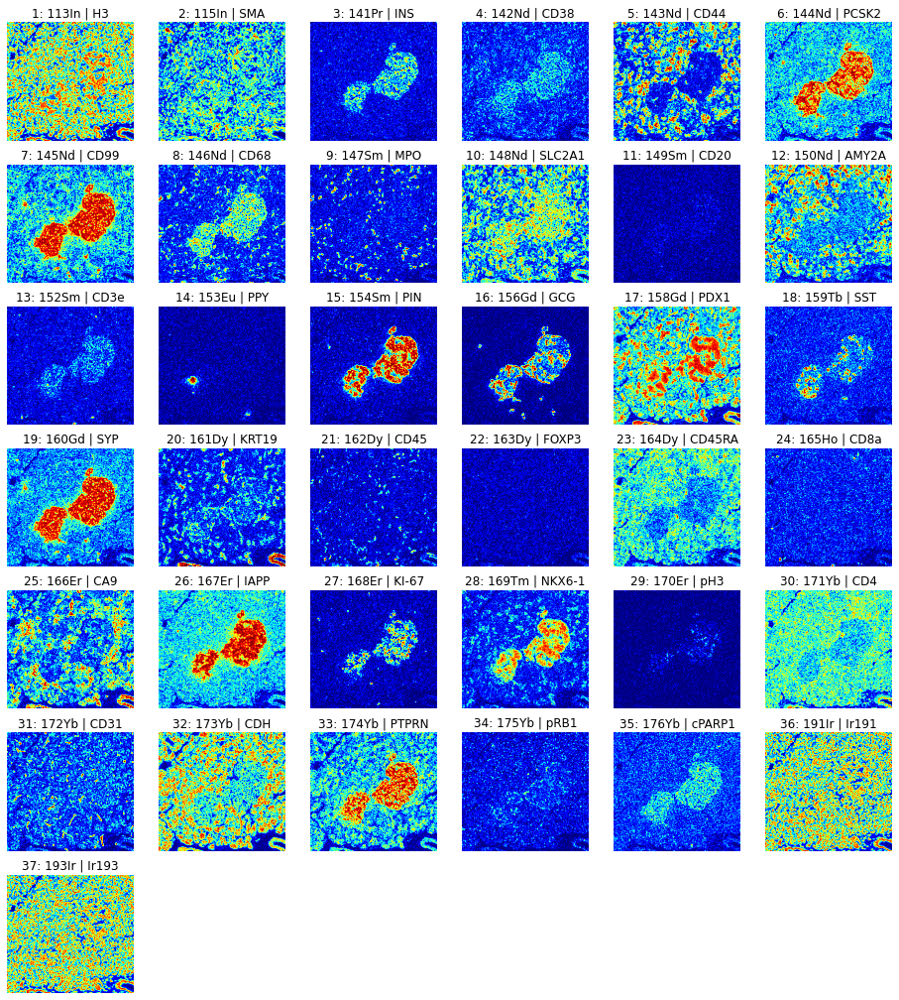

In [7]:
fig_fn = '%s/BMED320_experiments_case6126_E08_channel_eq_mosaic_jet.pdf' % fn_fig_base
fig, axes = plt.subplots(7, 6, figsize=(16, 18), sharex=False, sharey=False)
ax = axes.ravel()
for i, item in enumerate(range(n_chn)):
    chn = np.squeeze(im[i,:,:])
    chn_eq = np.sort(chn.ravel()).searchsorted(chn)  # a kind of histogram equalization
    ax[i].imshow(chn_eq, cmap='jet' )   # cmap='jet', 'gray'
    ax[i].set_title('%d: %s | %s' % ((i+1), df_p_sort_chn['Metal Tag'].iloc[i], df_p_sort_chn['Short Name'].iloc[i]))
    ax[i].axis('off')
chn_0 = np.zeros(chn.shape )   
for j in range(n_chn,7*6):
    ax[j].imshow(chn_0, cmap='gray_r') 
    ax[j].axis('off')
# plt.savefig(fig_fn, bbox_inches='tight')
plt.show()

### Read neuroimaging NIFTI-formated multichannel IMC image 
**(for using neuroimaging display tools like Freesurfer's [FreeView](https://surfer.nmr.mgh.harvard.edu/fswiki/FreeviewGuide/FreeviewGeneralUsage/FreeviewInterface) or FSL's [FSLeyes](https://users.fmrib.ox.ac.uk/~paulmc/fsleyes/userdoc/latest)**

In [8]:
imc_nii = nib.load('./data/imc_%d_chns.nii.gz' % (im.shape[0]))
imc_nii_eq = nib.load('./data/imc_%d_chns_eq.nii.gz' % (im.shape[0]))

In [9]:
header = imc_nii.header
print(header.get_data_shape())

(567, 530, 1, 37)


In [10]:
image_data = imc_nii.get_fdata()
print(image_data.shape)
print(image_data.dtype)

(567, 530, 1, 37)
float64


## Read IMC .csv file into a Pandas dataframe 

In [11]:
dfIMC_fn = './data/BMED320_experiments_case6126_E08_CyTOF_pixels.csv'
dfIMC = pd.read_csv(dfIMC_fn)

In [12]:
inspect = pd.concat([dfIMC.head().T, dfIMC.tail().T], axis=1)
inspect

,0,1,2,3,4,300505,300506,300507,300508,300509
113In,1.066,11.754,18.484,15.564,19.813,14.342,30.667,29.274,23.422,16.829
115In,0.000,3.143,1.332,3.129,2.000,2.000,2.838,1.853,0.000,4.459
141Pr,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000
142Nd,0.000,1.000,1.275,0.000,0.000,0.000,0.000,0.000,0.000,0.000
143Nd,12.395,8.871,3.000,1.000,0.000,0.000,0.000,0.000,1.029,0.000
144Nd,2.376,5.189,3.032,2.126,3.000,2.000,1.282,1.751,1.344,3.032
145Nd,1.000,0.000,0.000,1.912,0.000,0.000,0.000,2.413,0.000,0.000
146Nd,0.000,2.414,0.000,0.000,0.000,0.000,0.000,1.037,0.000,0.000
147Sm,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000
148Nd,4.537,6.969,4.158,0.000,0.000,0.000,0.000,0.000,3.779,0.000


In [13]:
# Select last 2 columns for (row,col) pixel Position
dfPos = dfIMC.iloc[:,-2:]

# Exclude last 2 columns for the CyTOF Data
dfData = dfIMC.iloc[:,:-2]

In [14]:
print(dfPos.info())
print(dfPos.max())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300510 entries, 0 to 300509
Data columns (total 2 columns):
 #   Column  Non-Null Count   Dtype
---  ------  --------------   -----
 0   row     300510 non-null  int64
 1   col     300510 non-null  int64
dtypes: int64(2)
memory usage: 4.6 MB
None
row    529
col    566
dtype: int64


In [15]:
dfData.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300510 entries, 0 to 300509
Data columns (total 37 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   113In   300510 non-null  float64
 1   115In   300510 non-null  float64
 2   141Pr   300510 non-null  float64
 3   142Nd   300510 non-null  float64
 4   143Nd   300510 non-null  float64
 5   144Nd   300510 non-null  float64
 6   145Nd   300510 non-null  float64
 7   146Nd   300510 non-null  float64
 8   147Sm   300510 non-null  float64
 9   148Nd   300510 non-null  float64
 10  149Sm   300510 non-null  float64
 11  150Nd   300510 non-null  float64
 12  152Sm   300510 non-null  float64
 13  153Eu   300510 non-null  float64
 14  154Sm   300510 non-null  float64
 15  156Gd   300510 non-null  float64
 16  158Gd   300510 non-null  float64
 17  159Tb   300510 non-null  float64
 18  160Gd   300510 non-null  float64
 19  161Dy   300510 non-null  float64
 20  162Dy   300510 non-null  float64
 21  163Dy   30

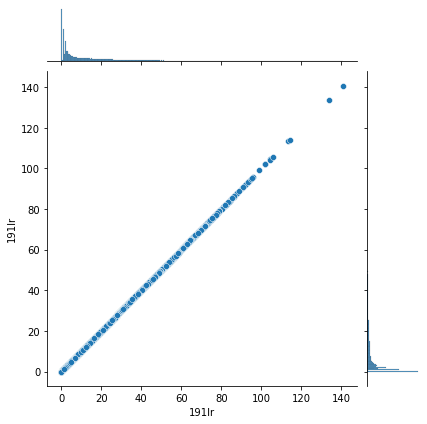

In [16]:
sns.jointplot(x=dfData['191Ir'], y=dfData['191Ir']);
plt.show()

### Correlation between features

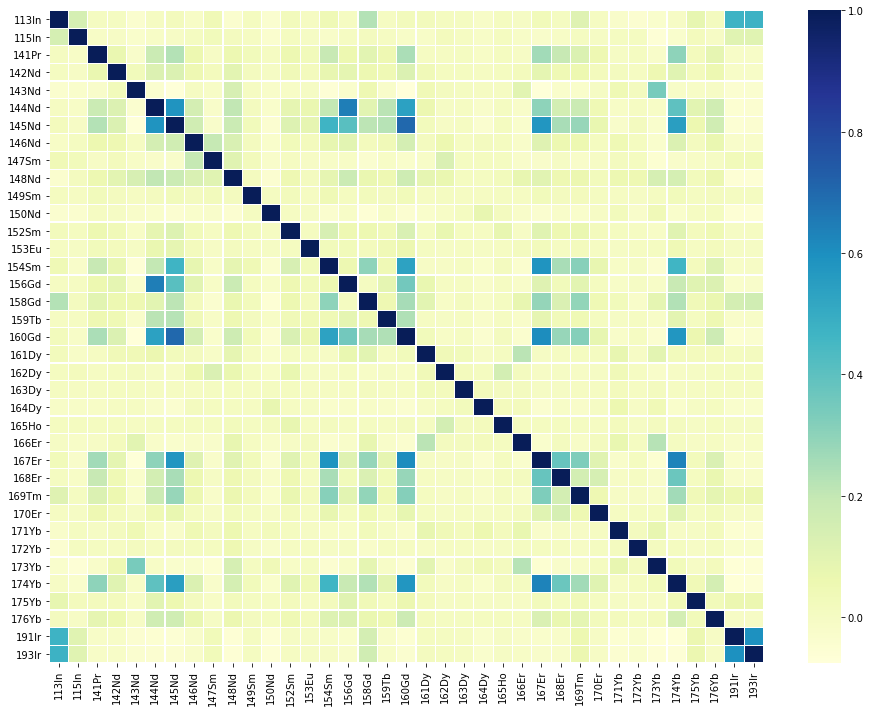

In [17]:
plt.figure(figsize=(16, 12))
#dfData.drop([''191Ir'', '191Ir'], axis=1, inplace=True)
corr = dfData.apply(lambda x: pd.factorize(x)[0]).corr()
ax = sns.heatmap(corr, xticklabels=corr.columns, yticklabels=corr.columns, 
                 linewidths=.2, cmap="YlGnBu")

#### TO DO:  Check out co-localisation (simultaneous presence of Tag_a (i.e. > t_a) and Tag_b (i.e. > t_b) at a given location (i.e. pixel)
#### Co-localiozation maps ?
#### Targeted channels ?

## Display DNA only (cell nuclei)  i.e. chn 36 (Ir191) and chn 37 (Ir193)
Hint from Jørn Skavland (Jorn.Skavland@uib.no) Oct 1st 2020 at https://www.uib.no/en/ccbio/136800/hyperion-imaging-system

### Cell nuclei segmentation using point-wise max of DNA channel signal and 
### Histogram-based thresholding (Otsu's method) https://en.wikipedia.org/wiki/Otsu%27s_method
(for better segmentation we could consider a two-dimensional Otsu's method, or adaptive thresholding)

See also:
- https://github.com/selamgit/Irregular-Grid-for-Local-Otsu-Segmentation
- https://github.com/pedrofrodenas/image-thresholding-OCR
- https://github.com/Liang-yc/IntegralThreshold
- https://www.bogotobogo.com/python/OpenCV_Python/python_opencv3_Image_Global_Thresholding_Adaptive_Thresholding_Otsus_Binarization_Segmentations.php

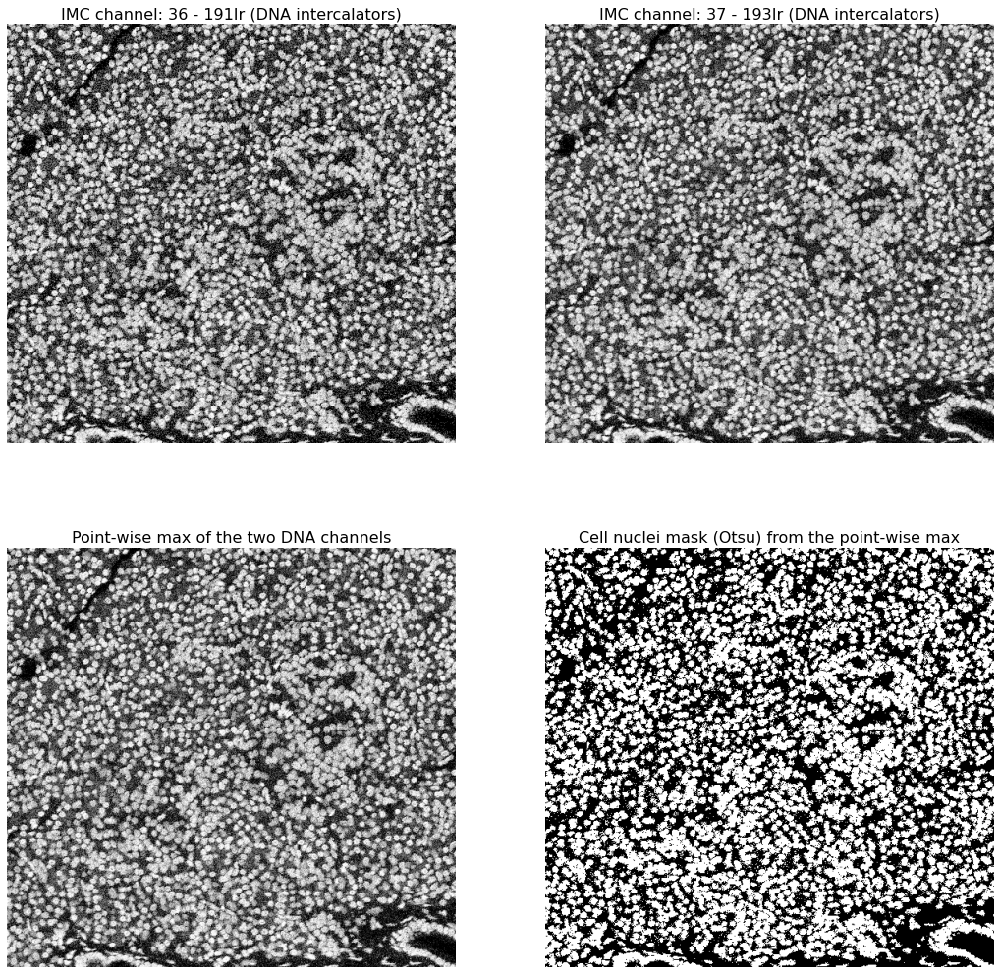

In [18]:
# df_p_sort_chn['Metal Tag'].iloc[c[2]]
fig_fn = '%s/BMED320_experiments_case6126_E08_DNA_channels_otsu_binarization.pdf' % fn_fig_base

# Select channels (-1 i.e. we are starting at channel 0)
c = [35, 36]

def hist_eq(chn):
    return np.sort(chn.ravel()).searchsorted(chn)

fig, axes = plt.subplots(2,2, figsize=(18,18))
ax = axes.ravel()
chn0 = np.flip(np.squeeze(im[c[0],:,:]), axis=0)
ax[0].imshow(hist_eq(chn0), cmap='gray', origin='lower')
ax[0].set(xlabel="")
ax[0].axis('off')
ax[0].set_title('IMC channel: %d - %s %s' % (c[0]+1, df_p_sort_chn['Metal Tag'].iloc[c[0]],
                                         df_p_sort_chn['Antigen'].iloc[c[0]]), size=16)

chn1 = np.flip(np.squeeze(im[c[1],:,:]), axis=0)
ax[1].imshow(hist_eq(chn1), cmap='gray', origin='lower')
ax[1].set(xlabel="")
ax[1].axis('off')
ax[1].set_title('IMC channel: %d - %s %s' % (c[1]+1,
                                             df_p_sort_chn['Metal Tag'].iloc[c[1]],
                                             df_p_sort_chn['Antigen'].iloc[c[1]]), size=16)

#chn = (chn0+chn1)/2   mean
chn = np.maximum(chn0, chn1)  # point-wise maximum of the two DNA channels
ax[2].imshow(hist_eq(chn), cmap='gray', origin='lower')
ax[2].set(xlabel="")
ax[2].axis('off')
ax[2].set_title('Point-wise max of the two DNA channels', size=16)

t = threshold_otsu(hist_eq(chn))
mask = hist_eq(chn) > t
# mask = ndimage.median_filter(hist_eq(chn)

# ax[3].imshow(mask, cmap='viridis', origin='lower')  #'viridis', 'gray'
ax[3].imshow(mask, cmap='gray', origin='lower')  #'viridis', 'gray'
ax[3].set_title('Cell nuclei mask (Otsu) from the point-wise max', size=16)
ax[3].axis('off')

plt.savefig(fig_fn, bbox_inches='tight')
plt.show()

In [19]:
# The cell candidate mask (to be saved to TIFF)
print(mask.min(), mask.max())
mask = np.flip(img_as_ubyte(mask), axis=0)
print(mask.min(), mask.max())

False True
0 255


In [20]:
# Save cell mask as tiff
#tiff.imsave('%s/Desktop/cell_mask.tiff' % (home), mask)
tiff.imsave('./data/E08_cell_candidate_mask.tiff', mask)

### Make a pointwise max image and a cell mask using median filtering, followed by Otsu's binarization method

In [21]:
# Select channels (-1 i.e. we are starting at channel 0)
c = [0, 35, 36]

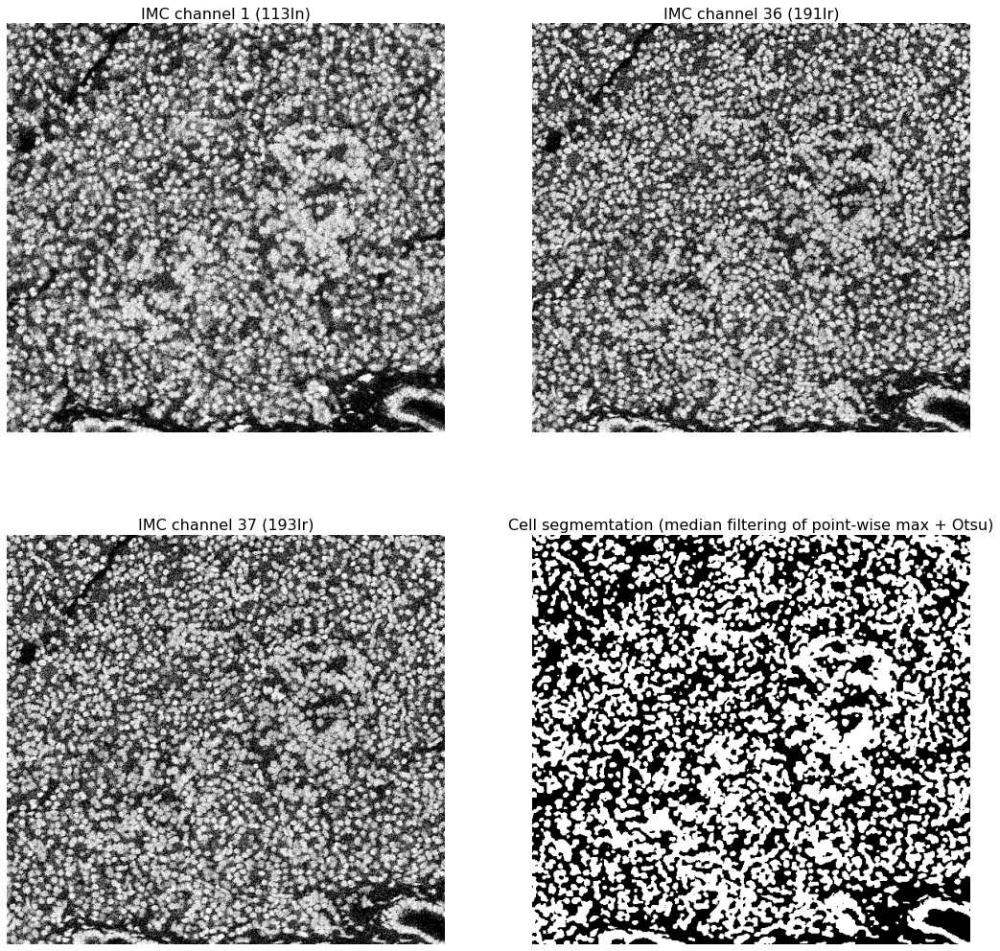

In [22]:
fig, axes = plt.subplots(2,2, figsize=(18,18))
ax = axes.ravel()
chn0 = np.flip(np.squeeze(im[c[0],:,:]), axis=0)
ax[0].imshow(hist_eq(chn0), cmap='gray', origin='lower')
ax[0].set(xlabel="")
ax[0].axis('off')
ax[0].set_title('IMC channel %d (%s)' % (c[0]+1, df_p_sort_chn['Metal Tag'].iloc[c[0]]), size=16)

chn1 = np.flip(np.squeeze(im[c[1],:,:]), axis=0)
ax[1].imshow(hist_eq(chn1), cmap='gray', origin='lower')
ax[1].set(xlabel="")
ax[1].axis('off')
ax[1].set_title('IMC channel %d (%s)' % (c[1]+1, df_p_sort_chn['Metal Tag'].iloc[c[1]]), size=16)

chn2 = np.flip(np.squeeze(im[c[2],:,:]), axis=0)
ax[2].imshow(hist_eq(chn1), cmap='gray', origin='lower')
ax[2].set(xlabel="")
ax[2].axis('off')
ax[2].set_title('IMC channel %d (%s)' % (c[2]+1, df_p_sort_chn['Metal Tag'].iloc[c[2]]), size=16)


chn01 = np.maximum(chn0, chn1)  # point-wise maximum of the two DNA channels
chn = np.maximum(chn01, chn2)  # point-wise maximum of the all three channels
chn_eq = hist_eq(chn) # histogram equalization
r = 2
chn_eq_med = median(chn_eq, disk(r)) # median filtering

# Some mathematical morphology to consider:
# see: https://scikit-image.org/docs/dev/auto_examples/color_exposure/plot_regional_maxima.html
# https://scikit-image.org/docs/dev/auto_examples/filters/plot_tophat.html

t = threshold_otsu(chn_eq_med)
mask = chn_eq_med > t

# mask = ndimage.median_filter(hist_eq(chn)

ax[3].imshow(mask, cmap='gray', origin='lower')
ax[3].set_title('Cell segmemtation (median filtering of point-wise max + Otsu)', size=16)
ax[3].axis('off')
plt.show()

In [23]:
# The cell candidate mask (to be saved to TIFF)
print(mask.min(), mask.max())
mask = np.flip(img_as_ubyte(mask), axis=0)
print(mask.min(), mask.max())

False True
0 255


In [24]:
# Save cell mask as tiff
#tiff.imsave('%s/Desktop/cell_mask.tiff' % (home), mask)
tiff.imsave('./data/E08_cell_candidate_mask_median_filtering.tiff', mask)

### Cell segmentation using the 3 nucleus channels: Histone H3  nuclei (chn1) and DNA (chn36, chn 37)

#  Experiments with maskSLIC from `scikit-image`

SLIC = Simple Linear Iterative Clustering <br>

Cf.https://scikit-image.org/docs/dev/api/skimage.segmentation.html?highlight=slic#skimage.segmentation.slic

See also 
- https://www.epfl.ch/labs/ivrl/research/slic-superpixels/#SLICO
- https://scikit-image.org/docs/dev/auto_examples/segmentation/plot_mask_slic.html#sphx-glr-auto-examples-segmentation-plot-mask-slic-py
- https://github.com/darshitajain/SLIC

This experiment is about comparing the segmentations obtained using the plain SLIC method [1] and its masked version maskSLIC [2].

The maskSLIC method is an extension of the SLIC method for the generation of superpixels in a region of interest. maskSLIC is able to overcome border problems that affects SLIC method, particularely in case of irregular mask.


[1] Radhakrishna Achanta, Appu Shaji, Kevin Smith, Aurelien Lucchi, Pascal Fua, and Sabine Suesstrunk, SLIC Superpixels Compared to State-of-the-art Superpixel Methods, [TPAMI](https://ieeexplore.ieee.org/document/6205760), May 2012. DOI:10.1109/TPAMI.2012.120

[2] Irving, Benjamin. “maskSLIC: regional superpixel generation with application to local pathology characterisation in medical images.”, 2016, [arXiv:1606.09518](https://arxiv.org/abs/1606.09518)

```
Segments image using k-means clustering in Color-(x,y,z) space:

skimage.segmentation.slic(image, n_segments=100, compactness=10.0, max_iter=10, sigma=0, spacing=None, 
multichannel=True, convert2lab=None, enforce_connectivity=True, min_size_factor=0.5, max_size_factor=3, slic_zero=False, start_label=None, mask=None)

n_segments - The (approximate) number of labels in the segmented output image

compactness - Balances color proximity and space proximity. Higher values give more weight to space proximity, making superpixel shapes more square/cubic. In SLICO mode, this is the initial compactness. 
This parameter depends strongly on image contrast and on the shapes of objects in the image. 
We recommend exploring possible values on a log scale, e.g., 0.01, 0.1, 1, 10, 100, before refining around a chosen value

max_iter - Maximum number of iterations of k-means

sigma - Width of Gaussian smoothing kernel for pre-processing for each dimension of the image. 
The same sigma is applied to each dimension in case of a scalar value. Zero means no smoothing. Note, that sigma is automatically scaled if it is scalar and a manual voxel spacing is provided

````

In [25]:
# Select channels (-1 i.e. we are starting at channel 0)
c = [0, 35, 36]

#### Make a multichannel "RGB" image and mask using mathematical morphology

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


img: (530, 567, 3) 0.0 300509.0
lum: (530, 567) 0.0 0.9997831725505726
mmask: (530, 567) 0 1


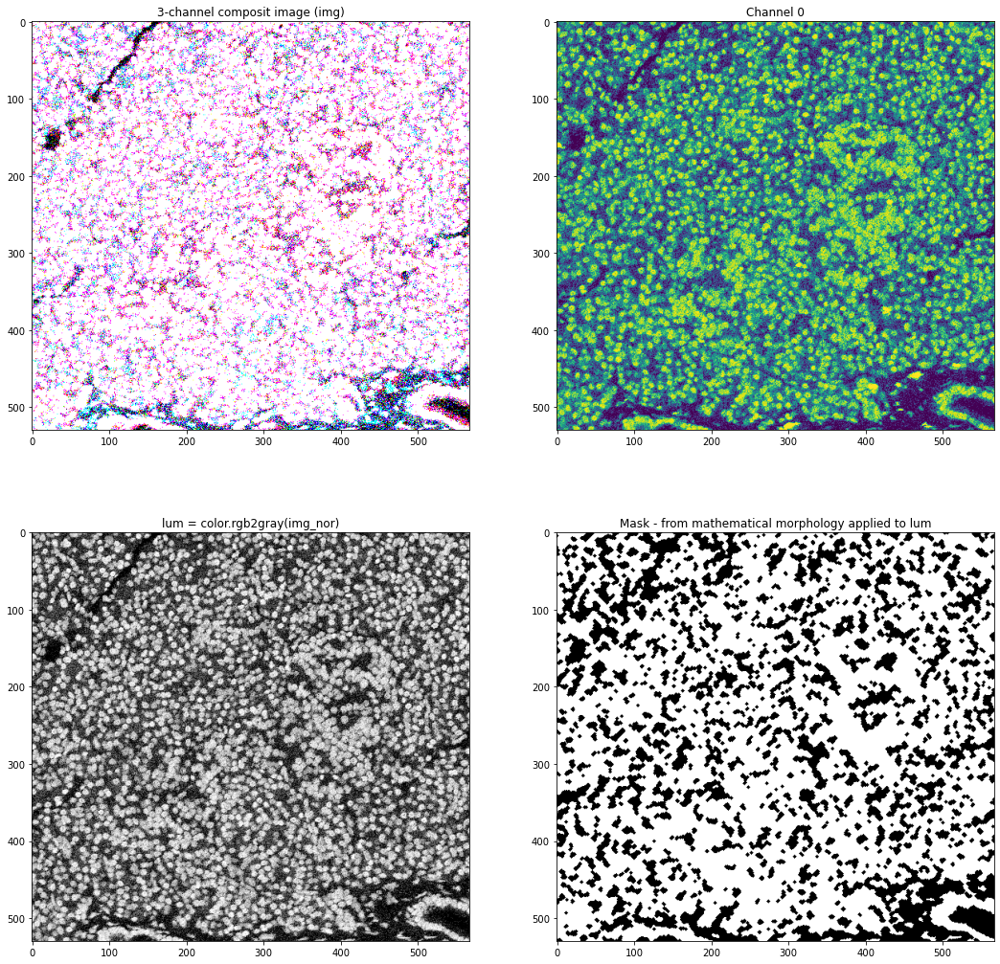

In [26]:
from skimage import data
from skimage import color
from skimage import morphology
from skimage import segmentation


img = np.zeros((im.shape[1],im.shape[2],3), dtype=float)
img[:,:,0] = hist_eq(np.squeeze(im[c[0],:,:]))
img[:,:,1] = hist_eq(np.squeeze(im[c[1],:,:]))
img[:,:,2] = hist_eq(np.squeeze(im[c[2],:,:]))
img_nor = img / np.max(img)


aa = 0.4    # 0.7
bb = 10     # 500
cc = 10     # 500
dd = 2      # 3

lum = color.rgb2gray(img_nor)

mmask = morphology.remove_small_holes(morphology.remove_small_objects(lum < aa, bb), cc)
mmask = 1- morphology.opening(mmask, morphology.disk(dd))

print("img:", img.shape, img.min(), img.max())
print("lum:", lum.shape, lum.min(), lum.max())
print("mmask:", mmask.shape, mmask.min(), mmask.max())

fig = plt.subplots(2,2, figsize=(18,18))
plt.subplot(2,2,1)
plt.imshow(img)
plt.title("3-channel composit image (img)")
plt.subplot(2,2,2)
plt.imshow(img[:,:,0], cmap='viridis')
plt.title("Channel %d" % (c[0]))
plt.subplot(2,2,3)
plt.imshow(lum, cmap='gray')
plt.title("lum = color.rgb2gray(img_nor)")
plt.subplot(2,2,4)
plt.imshow(mmask, cmap='gray')
plt.title("Mask - from mathematical morphology applied to lum")

plt.show()


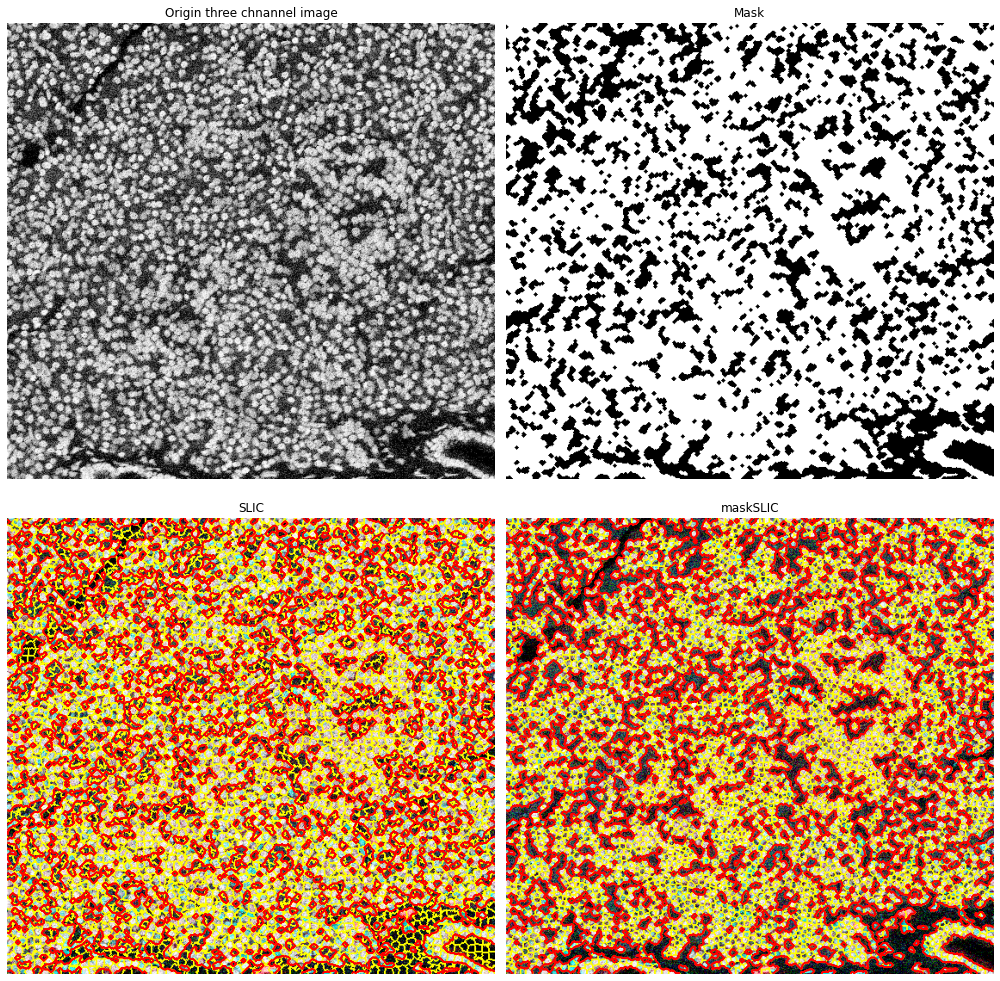

Wall time: 40.1 s


In [27]:
%%time
n_segments = 5000  # 200
m_n_segments = 5000 # 100

compactness =  50   # 0.01, 0.1, 1, 10, 100   [default 10.0]

# SLIC result
slic = segmentation.slic(img_nor, n_segments=n_segments, compactness=compactness, start_label=1)

# maskSLIC result
m_slic = segmentation.slic(img_nor, 
                           n_segments=m_n_segments,
                           max_iter=100,
                           spacing=None,
                           multichannel=True,
                           sigma=10.5,
                           compactness=compactness,
                           enforce_connectivity=True,
                           slic_zero=False,
                           mask=mmask, 
                           start_label=1)

# Display result
fig, ax_arr = plt.subplots(2, 2, sharex=True, sharey=True, figsize=(14, 14))
ax1, ax2, ax3, ax4 = ax_arr.ravel()

ax1.imshow(lum, cmap='gray')
ax1.set_title("Origin three chnannel image")

ax2.imshow(mmask, cmap="gray")
ax2.set_title("Mask")

ax3.imshow(segmentation.mark_boundaries(img_nor, slic))
ax3.contour(mmask, colors='red', linewidths=1)
ax3.set_title("SLIC")

ax4.imshow(segmentation.mark_boundaries(img_nor, m_slic))
ax4.contour(mmask, colors='red', linewidths=1)
ax4.set_title("maskSLIC")

for ax in ax_arr.ravel():
    ax.set_axis_off()

plt.tight_layout()
plt.show()

## Make a Pandas dataframe of all pixel signatures within the cell candidate mask

#### Channel names

In [28]:
chn_names = list(df_p_sort_chn['Metal Tag'].iloc[:])

In [29]:
# Since cells are all over the slide, we could also let this ROI be the whole first channel in the slide stack + 1, i.e.
im_msk = im[0,:,:]+1
print(im_msk.flatten().min())
print(im_msk.flatten().max())
im_msk.shape

1.0
378.168


(530, 567)

### However, we will use a restricted ROI mask for the cells in the slide.
**Find voxel locations (ind_roi) corresponding to cell ROI (value >=1 inside ROI, 0 else) using Numpy's `where`**

In [30]:
ind_roi = np.where(mask > 0)
print('Total number of pixels: %d, Number of pixels within cell candidates: %d (%.1f%%)' % \
      (len(im_msk.flatten()), len(ind_roi[0]), 100*len(ind_roi[0])/len(im_msk.flatten())))

Total number of pixels: 300510, Number of pixels within cell candidates: 150526 (50.1%)


### Extracting a dataset X and the corresponding pixel locations into a Pandas data frame (dfROI)

In [31]:
X = np.transpose(np.asarray(im[:,ind_roi[0],ind_roi[1]])) # The pixel channel signatures within the ROI
print(X.shape)
dfROI = pd.DataFrame(X, columns = zip(range(len(chn_names)), chn_names))

(150526, 37)


### Check feature vectors (CyTOF pixel signatures) for the ten first pixels within the cells ROI

In [32]:
dfROI.head(10).T   # .T as column vectors

,0,1,2,3,4,5,6,7,8,9
"(0, 113In)",11.754000,18.483999,15.564000,19.813000,9.268000,8.750000,6.564,3.391000,21.261999,16.070999
"(1, 115In)",3.143000,1.332000,3.129000,2.000000,1.000000,2.000000,1.000,1.361000,1.000000,0.000000
"(2, 141Pr)",0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000,0.000000,0.000000,0.000000
"(3, 142Nd)",1.000000,1.275000,0.000000,0.000000,0.000000,1.026000,0.000,2.000000,2.000000,0.000000
"(4, 143Nd)",8.871000,3.000000,1.000000,0.000000,1.000000,4.491000,4.778,2.466000,0.000000,1.497000
"(5, 144Nd)",5.189000,3.032000,2.126000,3.000000,0.000000,2.814000,0.000,0.000000,0.000000,1.532000
"(6, 145Nd)",0.000000,0.000000,1.912000,0.000000,0.000000,1.000000,0.000,0.000000,1.000000,0.000000
"(7, 146Nd)",2.414000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000,0.000000,0.000000,0.000000
"(8, 147Sm)",0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000,0.000000,0.000000,4.095000
"(9, 148Nd)",6.969000,4.158000,0.000000,0.000000,0.000000,0.758000,2.105,3.590000,3.000000,6.821000


### Check feature vectors (CyTOF pixel signatures) for the ten last pixels within the ROI

In [33]:
dfROI.tail(10).T

,150516,150517,150518,150519,150520,150521,150522,150523,150524,150525
"(0, 113In)",21.837999,21.924999,18.957001,35.752998,27.349001,14.342000,30.667000,29.274000,23.422001,16.829
"(1, 115In)",5.675000,4.000000,1.274000,1.000000,4.664000,2.000000,2.838000,1.853000,0.000000,4.459
"(2, 141Pr)",0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000
"(3, 142Nd)",0.000000,0.000000,0.000000,0.000000,1.213000,0.000000,0.000000,0.000000,0.000000,0.000
"(4, 143Nd)",0.000000,1.000000,0.000000,1.468000,0.000000,0.000000,0.000000,0.000000,1.029000,0.000
"(5, 144Nd)",0.000000,1.000000,2.000000,0.000000,0.000000,2.000000,1.282000,1.751000,1.344000,3.032
"(6, 145Nd)",0.000000,0.000000,0.000000,1.316000,0.000000,0.000000,0.000000,2.413000,0.000000,0.000
"(7, 146Nd)",0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.037000,0.000000,0.000
"(8, 147Sm)",0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000
"(9, 148Nd)",0.000000,0.000000,6.463000,0.000000,1.674000,0.000000,0.000000,0.000000,3.779000,0.000


### Insert pixel locations (row,col) from the ROI into the dfROI data frame

In [34]:
dfROI.insert(loc = len(dfROI.columns),
           column = 'row',
           value = ind_roi[0])  # Row of pixel location
dfROI.insert(loc = len(dfROI.columns),
           column = 'col',
           value = ind_roi[1])  # Col of pixel location

### and inspect the result

In [35]:
print(dfROI.columns[0],',...,',dfROI.columns[-3], ',', dfROI.columns[-2],',', dfROI.columns[-1])

(0, '113In') ,..., (36, '193Ir') , row , col


In [36]:
print(dfROI.iloc[0][-3:])
print(dfROI.iloc[-1][-3:])

(36, 193Ir)    18.249001
row             0.000000
col             1.000000
Name: 0, dtype: float64
(36, 193Ir)     27.128
row            529.000
col            566.000
Name: 150525, dtype: float64


## Restriction to a small, quadratic 64 x 64 ROI within the slide

(64, 64)
(530, 567)


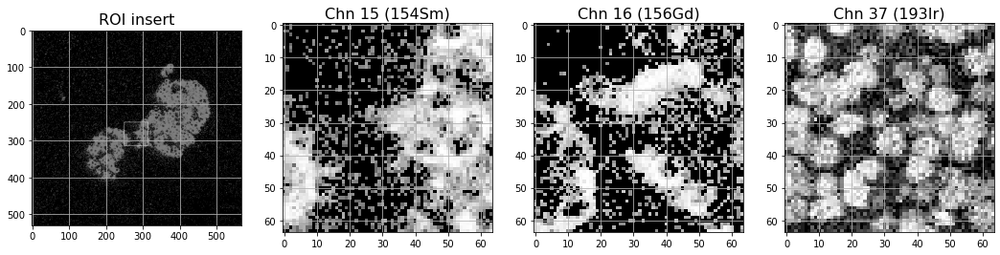

In [37]:
my_chn = [14, 15, 36]

rl=250; ru=314
cl=250; cu=314
msk2 = hist_eq(im[my_chn[0],rl:ru, cl:cu])+1
print(msk2.shape)

ima = hist_eq(np.squeeze(im[my_chn[0],:, :]))
print(ima.shape)
mx = hist_eq(im[my_chn[0],:,:]).max()*2
ima[rl:ru,cl] = mx
ima[rl:ru,cu] = mx
ima[rl,cl:cu] = mx
ima[ru,cl:cu] = mx


fig, axes = plt.subplots(1,4, figsize=(18,15))
plt.subplot(1,4,1)
plt.imshow(ima, cmap='gray')
plt.grid()
plt.title('ROI insert', size=16)
plt.subplot(1,4,2)
plt.imshow(hist_eq(im[my_chn[0],rl:ru, cl:cu]), cmap='gray')
plt.grid()
plt.title('Chn %d (%s)' % (my_chn[0]+1, chn_names[my_chn[0]]), size=16)
plt.subplot(1,4,3)
plt.imshow(hist_eq(im[my_chn[1],rl:ru, cl:cu]), cmap='gray')
plt.grid()
plt.title('Chn %d (%s)' % (my_chn[1]+1, chn_names[my_chn[1]]), size=16)
plt.subplot(1,4,4)
plt.imshow(hist_eq(im[my_chn[2],rl:ru, cl:cu]), cmap='gray')
plt.grid()
plt.title('Chn %d (%s)' % (my_chn[2]+1, chn_names[my_chn[2]]), size=16)
plt.show()

### Make a multichannel IMC image of the small 64 x 64 ROI insert

In [38]:
roi_insert = np.zeros(shape=(msk2.shape[0], msk2.shape[1], 1, len(chn_names)))
roi_insert_eq = np.zeros(shape=(msk2.shape[0], msk2.shape[1], 1, len(chn_names)))
print(roi_insert.shape)
for i in range(len(chn_names)):
    a = im[i,rl:ru, cl:cu]
    b = hist_eq(im[i,rl:ru, cl:cu])
    roi_insert[:,:,0,i] = a  # /a.max()
    roi_insert_eq[:,:,0,i] = b  # /b.max()

(64, 64, 1, 37)


### Make a neuroimaging NIFTI-formated multichannel image (for using neuroimaging tools like FreeView)

In [39]:
roi_nii = nib.Nifti1Image(roi_insert, affine=np.eye(4))
roi_nii_eq = nib.Nifti1Image(roi_insert_eq, affine=np.eye(4))  # "histogram equalized channels" image

#### Save this NIFT image to disk

In [40]:
nib.save(roi_nii, './data/roi_insert.nii.gz')
nib.save(roi_nii_eq, './data/roi_insert_eq.nii.gz')